In [1]:
import numpy as np
import scipy.stats as stats
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from sklearn import preprocessing
import math

sns.set_style('whitegrid')

%config InlineBackend.figure_format = 'retina'
%matplotlib inline

In [2]:
london = pd.read_csv('/Users/jyots/Desktop/DSI-SF-4-Jyojha/Capstone_Project/airbnb_DataSets/Airbnb listings in London, January 2016.csv',
                   encoding='utf8')

In [3]:
london.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34414 entries, 0 to 34413
Data columns (total 16 columns):
Unnamed: 0              34414 non-null int64
room_id                 34414 non-null int64
host_id                 34399 non-null float64
room_type               34399 non-null object
borough                 34414 non-null object
neighborhood            34414 non-null object
reviews                 34414 non-null int64
overall_satisfaction    23551 non-null float64
accommodates            30121 non-null float64
bedrooms                34277 non-null float64
bathrooms               30471 non-null float64
price                   34414 non-null float64
minstay                 33416 non-null float64
latitude                34414 non-null float64
longitude               34414 non-null float64
collected               34414 non-null object
dtypes: float64(9), int64(3), object(4)
memory usage: 4.2+ MB


In [4]:
london = london[london['host_id'].notnull()]

In [5]:
london.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 34399 entries, 0 to 34413
Data columns (total 16 columns):
Unnamed: 0              34399 non-null int64
room_id                 34399 non-null int64
host_id                 34399 non-null float64
room_type               34399 non-null object
borough                 34399 non-null object
neighborhood            34399 non-null object
reviews                 34399 non-null int64
overall_satisfaction    23536 non-null float64
accommodates            30121 non-null float64
bedrooms                34277 non-null float64
bathrooms               30471 non-null float64
price                   34399 non-null float64
minstay                 33416 non-null float64
latitude                34399 non-null float64
longitude               34399 non-null float64
collected               34399 non-null object
dtypes: float64(9), int64(3), object(4)
memory usage: 4.5+ MB


In [8]:
london.borough.unique()

array([u'Croydon', u'Kensington and Chelsea', u'Haringey', u'Ealing',
       u'Lambeth', u'Islington', u'Hammersmith and Fulham',
       u'Richmond upon Thames', u'Wandsworth', u'Tower Hamlets', u'Barnet',
       u'Hackney', u'Camden', u'Newham', u'Southwark', u'Westminster',
       u'Waltham Forest', u'Hounslow', u'Lewisham', u'Brent', u'Bromley',
       u'Merton', u'Greenwich', u'Enfield', u'Kingston upon Thames',
       u'Redbridge', u'Sutton', u'City of London', u'Harrow', u'Hillingdon'], dtype=object)

In [28]:
custom = lambda x: np.average(x)
df1 = pd.DataFrame(london.groupby('borough').agg({'host_id':'count','reviews':'sum', 'price':custom}))


In [29]:
df1 = df1.reset_index(level = 0)
df1.sort('host_id', ascending=False, inplace=True)

/Users/Jyots/anaconda/envs/dsi/lib/python2.7/site-packages/ipykernel/__main__.py:2: FutureWarning: sort(columns=....) is deprecated, use sort_values(by=.....)
  from ipykernel import kernelapp as app


In [30]:
df1.sort_values('borough',inplace=True)

In [31]:
df1 = df1.reset_index()

In [34]:
df1.head(2)


,index,borough,reviews,host_id,price
0,0,Barnet,3561,537,114.424581
1,1,Brent,7846,975,119.537436


In [35]:
def standardize(S):
    scaler = preprocessing.StandardScaler().fit(S)
    return scaler.transform(S)

In [36]:
df1.host_id = standardize(df1.host_id)
df1.reviews = standardize(df1.reviews)
df1.price = standardize(df1.price)

/Users/Jyots/anaconda/envs/dsi/lib/python2.7/site-packages/sklearn/utils/validation.py:429: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, _DataConversionWarning)
/Users/Jyots/anaconda/envs/dsi/lib/python2.7/site-packages/sklearn/preprocessing/data.py:586: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
/Users/Jyots/anaconda/envs/dsi/lib/python2.7/site-packages/sklearn/preprocessing/data.py:649: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWar

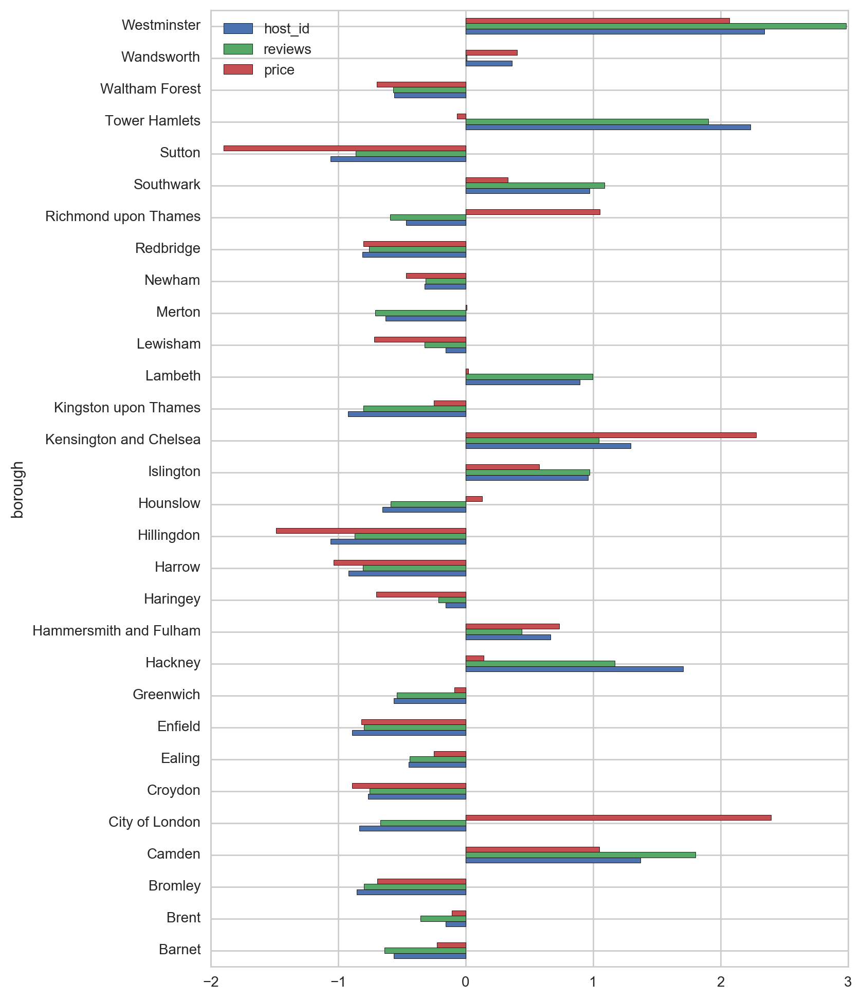

In [38]:
df1.plot(x = 'borough', y = ['host_id','reviews','price'], kind ='barh', figsize =(8, 12))

In [39]:
custom = lambda x: np.average(x)
df2 = pd.DataFrame(london.groupby(['borough','room_type']).agg({'host_id':'count','reviews':'sum', 'price':custom}))

In [40]:
df2.reset_index(level=0, inplace=True)
df2.reset_index(inplace=True)

In [41]:
df2.host_id = standardize(df2.host_id)
df2.reviews = standardize(df2.reviews)
df2.price = standardize(df2.price)
df2.head()

/Users/Jyots/anaconda/envs/dsi/lib/python2.7/site-packages/sklearn/preprocessing/data.py:586: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
/Users/Jyots/anaconda/envs/dsi/lib/python2.7/site-packages/sklearn/preprocessing/data.py:649: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
/Users/Jyots/anaconda/envs/dsi/lib/python2.7/site-packages/sklearn/preprocessing/data.py:586: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either usin

,room_type,borough,reviews,host_id,price
0,Entire home/apt,Barnet,-0.465061,-0.343467,1.197516
1,Private room,Barnet,-0.315570,-0.164336,-0.540261
2,Shared room,Barnet,-0.628502,-0.716503,-0.477322
3,Entire home/apt,Brent,-0.149530,0.203160,0.929815
4,Private room,Brent,-0.047089,0.097897,-0.514169


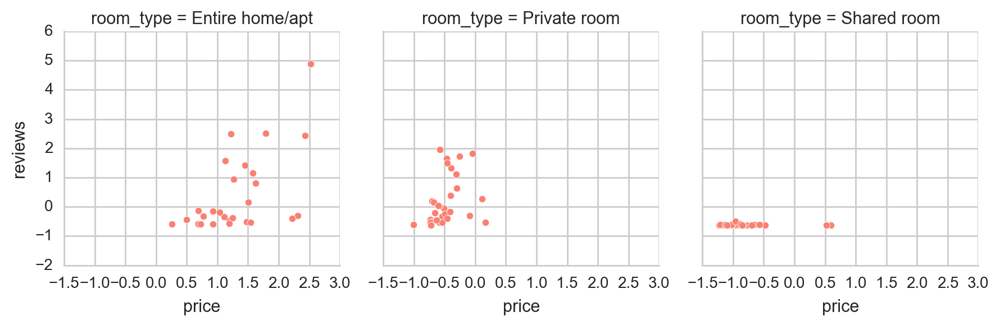

In [42]:
g = sns.FacetGrid(df2, col="room_type")
g = g.map(plt.scatter,"price","reviews", edgecolor="w", color = "salmon")

In [43]:
custom = lambda x: np.average(x)
neighborhood_data = pd.DataFrame(london.groupby('borough').agg({'host_id':'count','reviews':'sum', 'price':custom, 'latitude':custom,'longitude':custom}))

In [44]:
neighborhood_data.reset_index(inplace =True)

In [45]:
neighborhood_data.head(2)

,borough,reviews,host_id,price,longitude,latitude
0,Barnet,3561,537,114.424581,-0.200835,51.595273
1,Brent,7846,975,119.537436,-0.231235,51.544880


In [46]:
# define price

def price_color(neighborhood_data, row):
    
    price_max = np.max(neighborhood_data.price)
    price_min = np.min(neighborhood_data.price)
    
    
    if price_min <= neighborhood_data.ix[row, 'price'] < price_min + ((price_max - price_min)/3):
        return 'green'
    elif price_min + ((price_max - price_min)/3) <= neighborhood_data.ix[row, 'price'] < (price_min + 2*(price_max - price_min)/3):
        return 'orange'
    else:
        return 'red'

In [47]:
import folium

In [48]:
london_map = folium.Map(location=[51.509865, -0.118092])

for each_row in range(neighborhood_data.shape[0]):
     london_map.simple_marker(location = [neighborhood_data.ix[each_row,'latitude'],neighborhood_data.ix[each_row,'longitude']],
                            popup = str(neighborhood_data.ix[each_row,'borough'])+" "+str(neighborhood_data.ix[each_row,'price']),
                            marker_color = price_color(neighborhood_data,each_row)
                            )

/Users/Jyots/anaconda/envs/dsi/lib/python2.7/site-packages/ipykernel/__main__.py:6: FutureWarning: simple_marker is deprecated. Use add_children(Marker) instead


In [49]:
london_map

In [21]:
import json

In [50]:
with open('/Users/Jyots/Desktop/DS_Projects/airbnb_datasets/london.geojson') as fp:

     geodata = json.load(fp)

In [51]:
geodata.keys()

[u'type', u'features']

In [230]:
#geodata['features'][6]['geometry']['coordinates'][0]

In [55]:
neighborhood_coords = {}

for i in range(len(geodata['features'])):
    neighborhood_coords[geodata['features'][i]['properties']['name']] = geodata['features'][i]['geometry']['coordinates']

In [56]:
neighborhood_coords = pd.DataFrame(neighborhood_coords.items(), columns = ['neighborhood', 'long_lat'])

In [57]:
neighborhood_coords.sort_values('neighborhood',inplace=True)

In [58]:
neighborhood_coords = neighborhood_coords.reset_index()
neighborhood_coords.drop('index', axis=1)

,neighborhood,long_lat
0,Barking and Dagenham,"[[[[0.072632, 51.531225], [0.072631, 51.531234..."
1,Barnet,"[[[[-0.252164, 51.588021], [-0.252183, 51.5880..."
2,Bexley,"[[[[0.198864, 51.458171], [0.198864, 51.458171..."
3,Brent,"[[[[-0.290499, 51.535704], [-0.290556, 51.5356..."
4,Bromley,"[[[[0.09379, 51.320246], [0.093468, 51.320129]..."
5,Camden,"[[[[-0.128548, 51.51322], [-0.128556, 51.51322..."
6,City of London,"[[[-0.075824, 51.515829], [-0.073664, 51.51413..."
7,Croydon,"[[[[-0.007154, 51.333668], [-0.007147, 51.3336..."
8,Ealing,"[[[[-0.253141, 51.502321], [-0.253116, 51.5021..."
9,Enfield,"[[[[-0.035453, 51.6128], [-0.035453, 51.612799..."


In [151]:
#neighborhood_coords.long_lat[1][0]

In [59]:
neighborhood_coords['longitude'] = 0
neighborhood_coords['latitude'] = 0

In [228]:
#neighborhood_coords["long_lat"][6]

In [125]:
import shapely
from shapely.geometry import MultiPolygon, Point

In [180]:
# define the conversion function to convert the raw coordinates to coordinates for multipolygon

def PrepCoordsForShapely(rawcoords):
    preppedcoords = []
    #according to the geojson specs, a multipolygon is a list of linear rings, so we loop each
    for eachpolygon in rawcoords:
        #print eachpolygon
        #the first linear ring is the coordinates of the polygon, and shapely needs it to be a tuple
        tupleofcoords = tuple(eachpolygon[0])
        #the remaining linear rings, if any, are the coordinates of inner holes, and shapely needs these to be nested in a list
        if len(eachpolygon) > 1:
            listofholes = list(eachpolygon[1:])
        else:
            listofholes = []
        #shapely defines each polygon in a multipolygon with the polygoon coordinates and the list of holes nested inside a tuple
        eachpreppedpolygon = (tupleofcoords, listofholes)
        #so append each prepped polygon to the final multipolygon list
        preppedcoords.append(eachpreppedpolygon)
    #finally, the prepped coordinates need to be nested inside a list in order to be used as a star-argument for the MultiPolygon constructor.
    return [preppedcoords]



In [231]:
# Each borough except the sixth is made up of multiple polygons, first retrieve the coordinates 

for i in range(neighborhood_coords.shape[0]):
    rawcoords = neighborhood_coords["long_lat"][i]
    
    if geodata['features'][i]['geometry']['type'] == 'Polygon':
        poly = Polygon(neighborhood_coords.long_lat[i][0])
        neighborhood_coords.longitude[i] = poly.centroid.wkt.split()[1].split('(')[1]
        neighborhood_coords.latitude[i] = poly.centroid.wkt.split()[2].split(')')[0]
    
    else:
        
        # use the function to prepare coordinates for MultiPolygon
        preppedcoords = PrepCoordsForShapely(rawcoords)
    
       # use the prepped coordinates as a star-argument for the MultiPolygon constructor
        multipoly = MultiPolygon(*preppedcoords)
    
        neighborhood_coords.longitude[i] = multipoly.centroid.wkt.split()[1].split('(')[1]
        neighborhood_coords.latitude[i] = multipoly.centroid.wkt.split()[2].split(')')[0]



/Users/Jyots/anaconda/envs/dsi/lib/python2.7/site-packages/ipykernel/__main__.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/Users/Jyots/anaconda/envs/dsi/lib/python2.7/site-packages/ipykernel/__main__.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/Users/Jyots/anaconda/envs/dsi/lib/python2.7/site-packages/ipykernel/__main__.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/Users/Jyots/anaconda/envs/dsi/lib/python2.7/site-packages/ipykernel/__main__.py:9: SettingWithCopyWarni

In [233]:

neighborhood_coords.head(2)

,index,neighborhood,long_lat,longitude,latitude
0,10,Barking and Dagenham,"[[[[0.072632, 51.531225], [0.072631, 51.531234...",0.1335431447799576,51.5452689109009
1,7,Barnet,"[[[[-0.252164, 51.588021], [-0.252183, 51.5880...",-0.2100191707601186,51.61602644576919


In [22]:
import folium


In [234]:
path = '/users/Jyots/Desktop/DS_Projects/airbnb_DataSets/london.geojson'


nbrhd_map = folium.Map(location=[51.509865, -0.118092],
                    zoom_start=12)
nbrhd_map.choropleth(geo_path=path, fill_opacity=0.2,
                     line_opacity=0.8, line_weight=2)

In [235]:
for each_row in range(neighborhood_data.shape[0]):
     nbrhd_map.simple_marker(location = [neighborhood_coords.ix[each_row,'latitude'],neighborhood_coords.ix[each_row,'longitude']],
                            popup = str(neighborhood_data.ix[each_row,'borough'])+" "+str(neighborhood_data.ix[each_row,'price']),
                            marker_color = price_color(neighborhood_data,each_row)
                            )

/Users/Jyots/anaconda/envs/dsi/lib/python2.7/site-packages/ipykernel/__main__.py:4: FutureWarning: simple_marker is deprecated. Use add_children(Marker) instead


In [236]:
nbrhd_map

In [239]:
london_metro = pd.read_csv('/Users/jyots/Desktop/DS_Projects/airbnb_DataSets/London_stations.csv',
                   encoding='utf8')

In [240]:
london_metro.head(2)

,Station,OS X,OS Y,Latitude,Longitude,Zone,Postcode
0,Abbey Road,539081,183352,51.531952,0.003723,3,E15 3NB
1,Abbey Wood,547297,179002,51.490784,0.120272,4,SE2 9RH


In [278]:
london_metro.rename(columns={'Latitude':'latitude','Longitude':'longitude'}, inplace=True)

In [279]:
london_metro.head(2)

,Station,OS X,OS Y,latitude,longitude,Zone,Postcode
0,Abbey Road,539081,183352,51.531952,0.003723,3,E15 3NB
1,Abbey Wood,547297,179002,51.490784,0.120272,4,SE2 9RH


In [280]:
for each_row in range(london_metro.shape[0]):
     nbrhd_map.circle_marker(location = [london_metro.ix[each_row,'latitude'],london_metro.ix[each_row,'longitude']],
                         radius = 30,fill_color = 'blue',line_color = 'blue',fill_opacity = 0.8
                            )

/Users/Jyots/anaconda/envs/dsi/lib/python2.7/site-packages/ipykernel/__main__.py:3: FutureWarning: circle_marker is deprecated. Use add_children(CircleMarker) instead
  app.launch_new_instance()


In [281]:
nbrhd_map

In [257]:

# create polygon based on polygon or multipolygon type

def polygon_create(polygon_coords, row):

    
    rawcoords = polygon_coords["long_lat"][row]
    
    if geodata['features'][row]['geometry']['type'] == 'Polygon':
        poly = Polygon(rawcoords[0])
    
        return poly
    
    else:
        
        # use the function to prepare coordinates for MultiPolygon
        preppedcoords = PrepCoordsForShapely(rawcoords)
    
       # use the prepped coordinates as a star-argument for the MultiPolygon constructor
        multipoly = MultiPolygon(*preppedcoords)
    
        return multipoly
    

In [282]:
# finding the number of metro stations in each neighborhood

import shapely
from shapely.geometry import Polygon, Point


def dot_count(polygon_coords, dot_coords):
    count_dict = {}

    for row in range(polygon_coords.shape[0]):
        poly = polygon_create(polygon_coords, row)
        count = 0
        for i in range(dot_coords.shape[0]):
            point = Point(dot_coords.ix[i,'longitude'],dot_coords.ix[i,'latitude'])
            #print point
        
            if poly.contains(point):
                count = count + 1
        #print count
        nbrhd_name = polygon_coords.ix[row,'neighborhood']
        count_dict[nbrhd_name] = count
    
    return count_dict


In [283]:
metrostn_count = dot_count(neighborhood_coords, london_metro)

In [284]:
metrostn_count = pd.DataFrame(metrostn_count.items(),columns=['neighborhood','stn_count'])

In [285]:
metrostn_count.sort_values('neighborhood',inplace=True)

In [286]:
metrostn_count = metrostn_count.reset_index()

In [287]:
metrostn_count.head(2)

,index,neighborhood,stn_count
0,10,Barking and Dagenham,6
1,7,Barnet,18


In [267]:
import xmltodict

In [268]:
with open("/Users/Jyots/Desktop/DS_Projects/airbnb_datasets/London_restaurants_I _like.kml") as fp:

    rd = xmltodict.parse(fp)

In [277]:
#rd

In [270]:
rest_dict = {}

for point in rd['kml']['Document']['Folder']['Placemark']:
    rest_dict[point[u'name']] = point['Point'][u'coordinates'].split(",")

In [273]:
rest_data = pd.DataFrame(rest_dict.items(), columns =['rest_name','coordinates'])
rest_data.head(2)

,rest_name,coordinates
0,Thanh Binh (Vietnamese),"[-0.146253, 51.542241, 0.0]"
1,Traditional Plaice (Fish'n'Chips),"[-0.110092, 51.521379, 0.0]"


In [274]:
rest_data['longitude'] = rest_data['coordinates'].map(lambda x: float(x[0]))
rest_data['latitude'] = rest_data['coordinates'].map(lambda x: float(x[1]))

In [276]:
rest_data.head(2)

,rest_name,coordinates,longitude,latitude
0,Thanh Binh (Vietnamese),"[-0.146253, 51.542241, 0.0]",-0.146253,51.542241
1,Traditional Plaice (Fish'n'Chips),"[-0.110092, 51.521379, 0.0]",-0.110092,51.521379


In [288]:
rest_count = dot_count(neighborhood_coords, rest_data)


In [289]:
rest_count = pd.DataFrame(rest_count.items(), columns=['neighborhood','rest_count'])

In [290]:
rest_count.sort_values('neighborhood', inplace=True)

In [291]:
rest_count = rest_count.reset_index()

In [294]:
rest_count

,index,neighborhood,rest_count
0,10,Barking and Dagenham,0
1,7,Barnet,0
2,22,Bexley,0
3,32,Brent,0
4,25,Bromley,0
5,30,Camden,34
6,12,City of London,5
7,28,Croydon,0
8,23,Ealing,0
9,11,Enfield,0
